In [5]:
# =========================================================
# FULL DATA QUALITY VALIDATION & EDA
# =========================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import warnings

# Suppress warnings for clean output
warnings.simplefilter(action='ignore', category=FutureWarning)

# =========================================================
# 1. LOAD DATA
# =========================================================
df = pd.read_csv("fully_featured_materials.csv")
print("Loaded rows:", len(df))
print("Columns available:", df.columns.tolist())

Loaded rows: 150
Columns available: ['material_id', 'material_type', 'material_subtype', 'strength_MPa', 'weight_capacity_kg', 'density_g_per_cm3', 'cost_per_kg_usd', 'biodegradability_score', 'co2_emission_kgCO2_per_kg', 'recyclability_percentage', 'co2_impact_index', 'cost_efficiency_index', 'strength_norm', 'weight_capacity_norm', 'density_norm', 'biodegradability_norm', 'recyclability_norm', 'material_suitability_score']


In [6]:
# =========================================================
# 2. SUMMARY STATISTICS
# =========================================================
print("\n================ DESCRIPTIVE STATISTICS ================")
print(df.describe(include='all'))


================ DESCRIPTIVE STATISTICS ================
       material_id  material_type  material_subtype  strength_MPa  \
count    150.00000     150.000000        150.000000    150.000000   
mean       0.50000       5.480000          4.653333      0.497287   
std        0.29158       3.471301          2.782946      0.303914   
min        0.00000       0.000000          0.000000      0.000000   
25%        0.25000       3.000000          2.000000      0.237681   
50%        0.50000       5.000000          5.000000      0.510499   
75%        0.75000       9.000000          7.000000      0.751472   
max        1.00000      11.000000          9.000000      1.000000   

       weight_capacity_kg  density_g_per_cm3  cost_per_kg_usd  \
count          150.000000         150.000000       150.000000   
mean             0.500239           0.539434         0.441244   
std              0.297959           0.316502         0.280362   
min              0.000000           0.000000         0.00000


================ MISSING VALUES ================
material_id                   0
material_type                 0
material_subtype              0
strength_MPa                  0
weight_capacity_kg            0
density_g_per_cm3             0
cost_per_kg_usd               0
biodegradability_score        0
co2_emission_kgCO2_per_kg     0
recyclability_percentage      0
co2_impact_index              0
cost_efficiency_index         0
strength_norm                 0
weight_capacity_norm          0
density_norm                  0
biodegradability_norm         0
recyclability_norm            0
material_suitability_score    0
dtype: int64


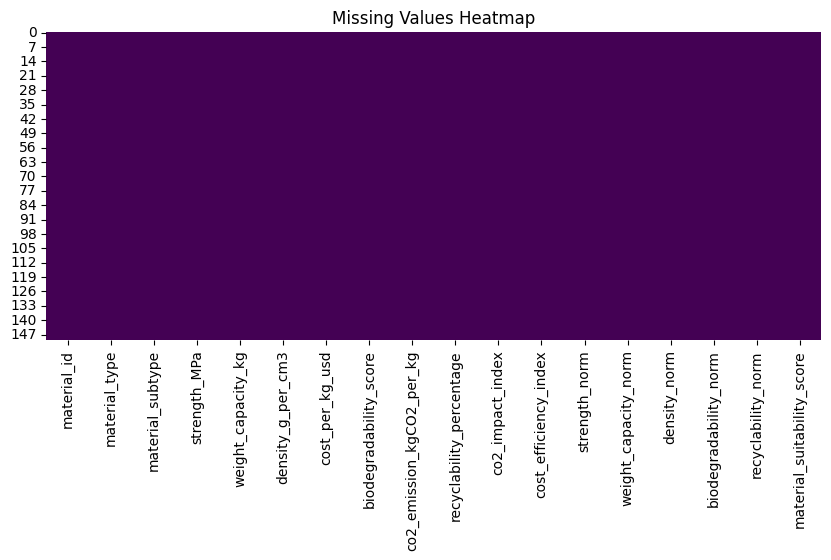

In [7]:

# =========================================================
# 3. MISSING VALUES
# =========================================================
print("\n================ MISSING VALUES ================")
print(df.isnull().sum())

plt.figure(figsize=(10,4))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

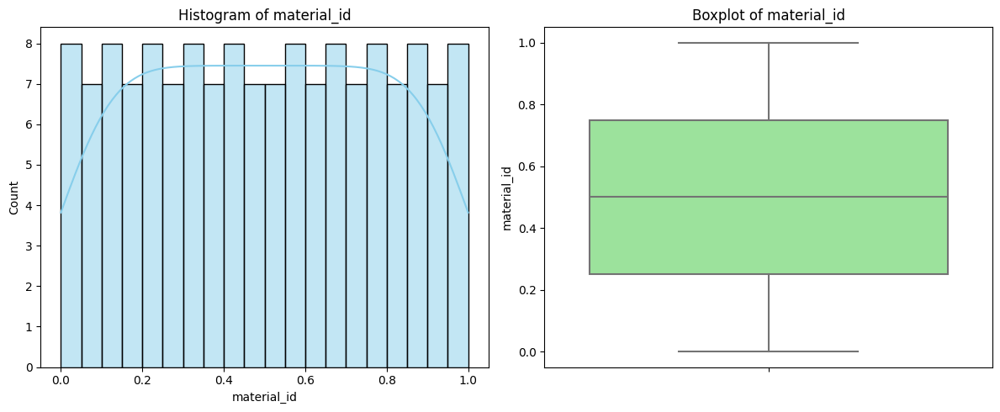

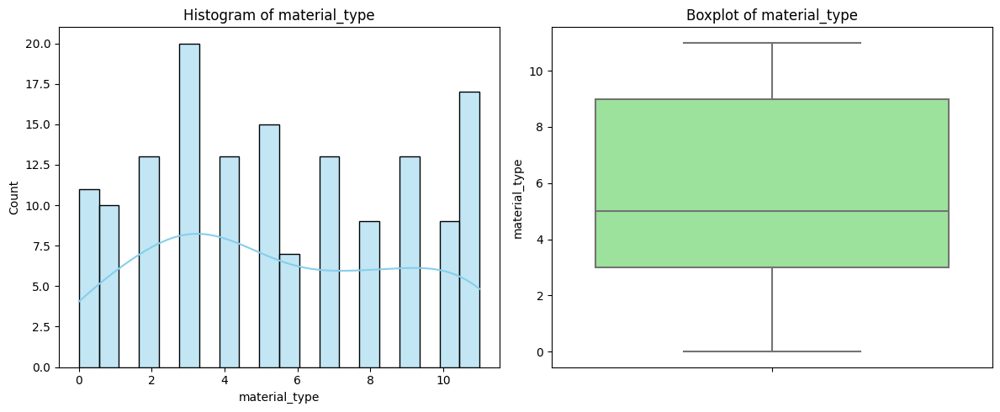

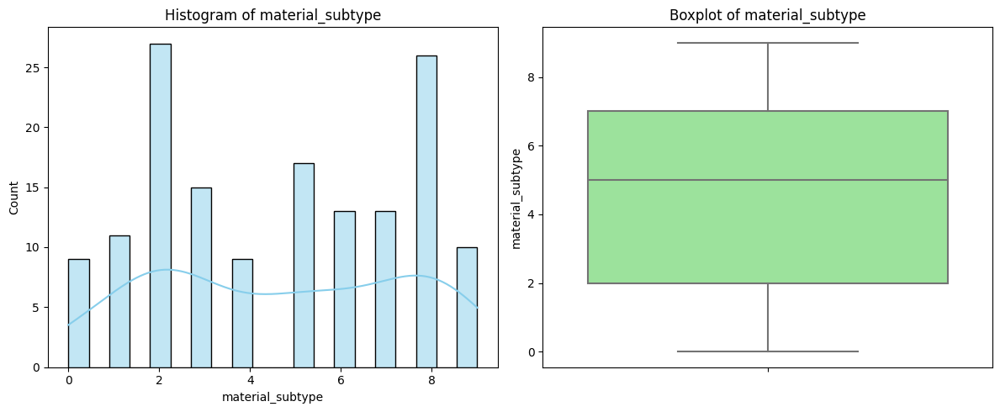

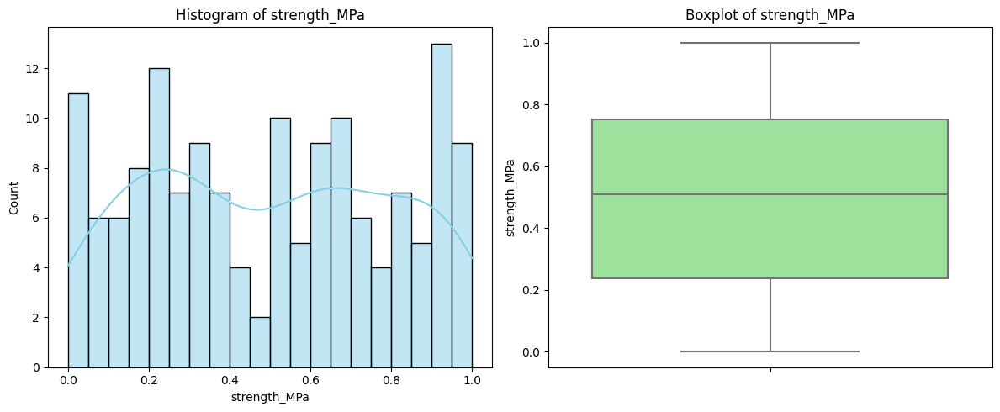

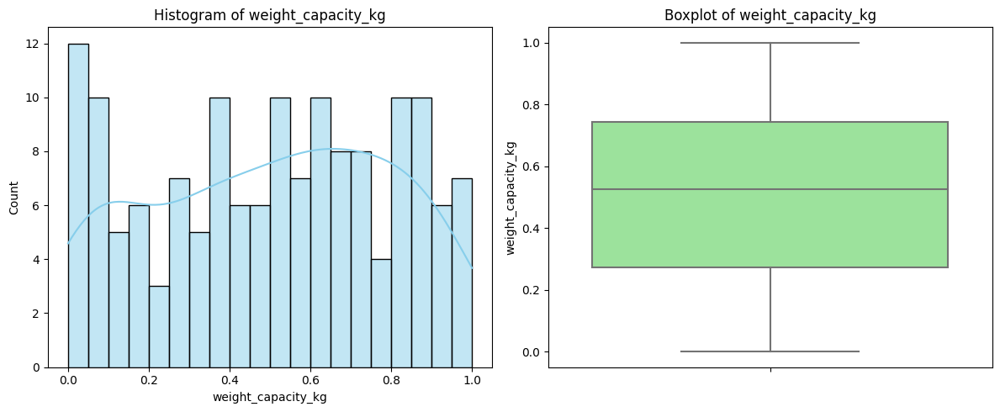

...

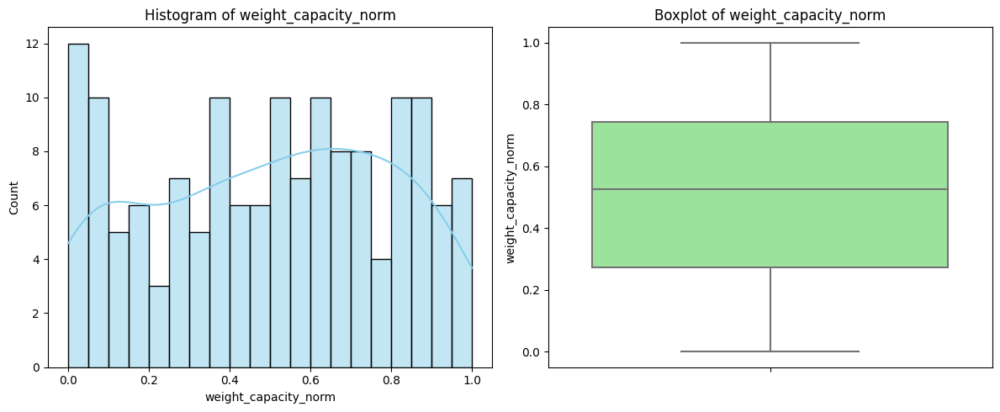

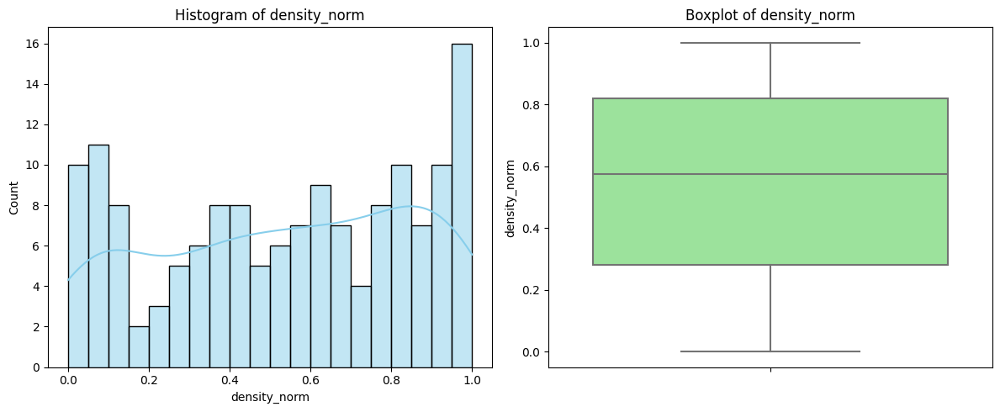

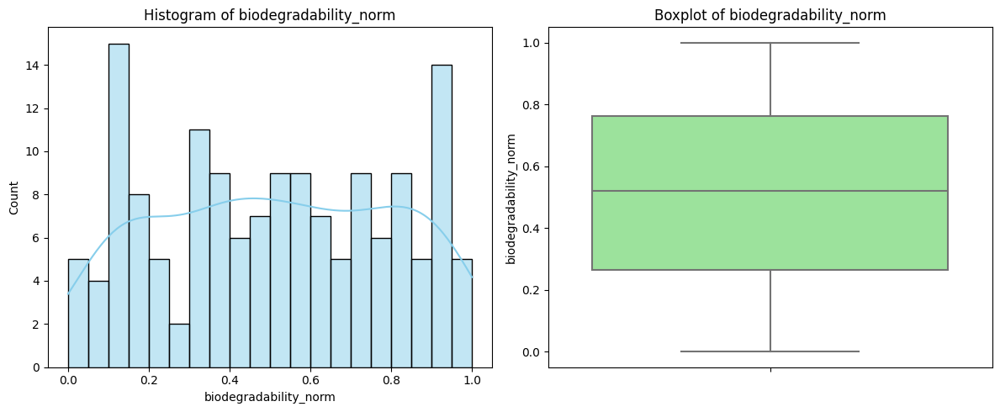

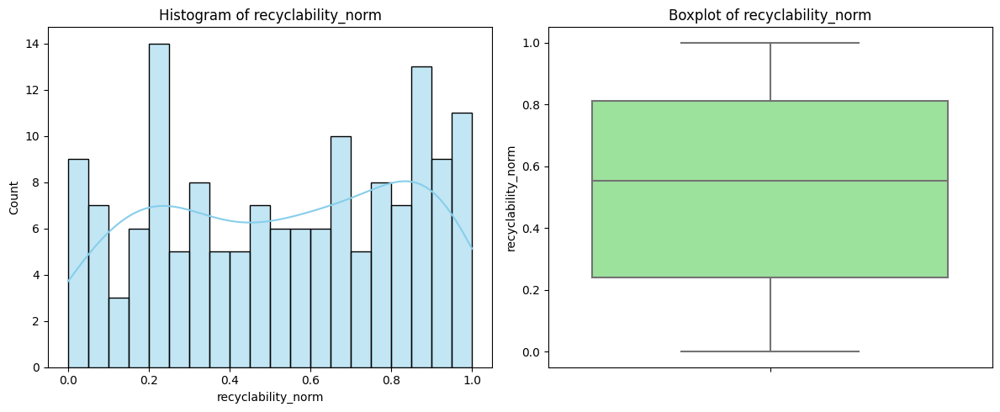

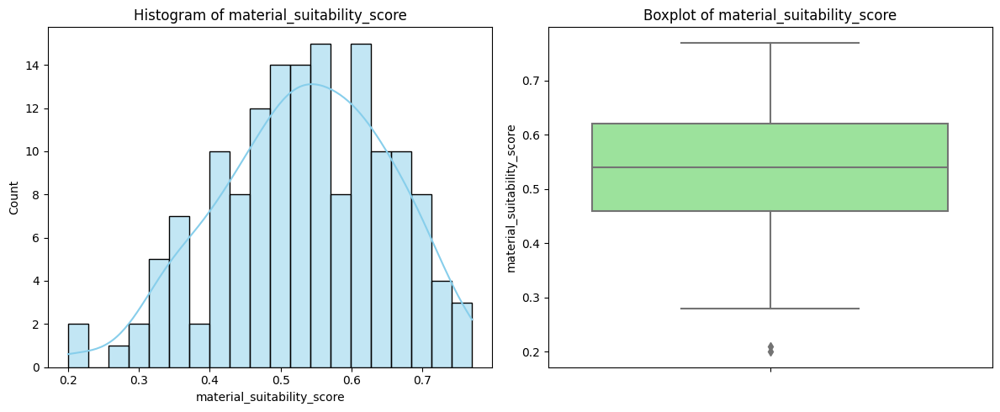

In [8]:

# =========================================================
# 4. NUMERIC FEATURE DISTRIBUTIONS
# =========================================================
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

for col in numeric_cols:
    plt.figure(figsize=(12,5))
    
    # Histogram
    plt.subplot(1,2,1)
    sns.histplot(df[col], kde=True, bins=20, color='skyblue')
    plt.title(f"Histogram of {col}")
    
    # Boxplot
    plt.subplot(1,2,2)
    sns.boxplot(y=df[col], color='lightgreen')
    plt.title(f"Boxplot of {col}")
    
    plt.tight_layout()
    plt.show()


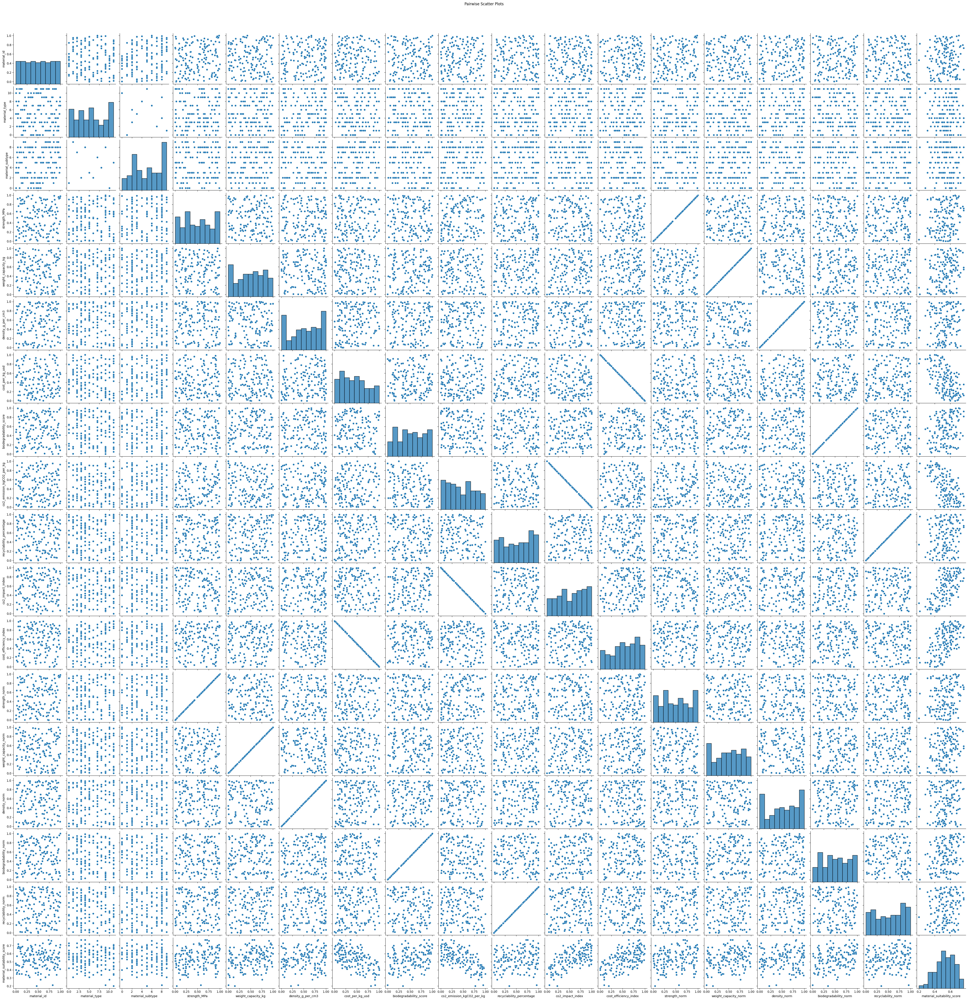

In [9]:

# =========================================================
# 5. SCATTER PLOTS (pairwise numeric features)
# =========================================================
if len(numeric_cols) > 1:
    sns.pairplot(df[numeric_cols])
    plt.suptitle("Pairwise Scatter Plots", y=1.02)
    plt.show()

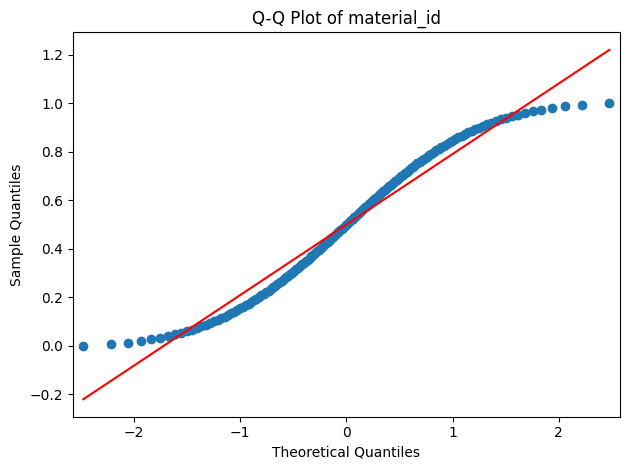

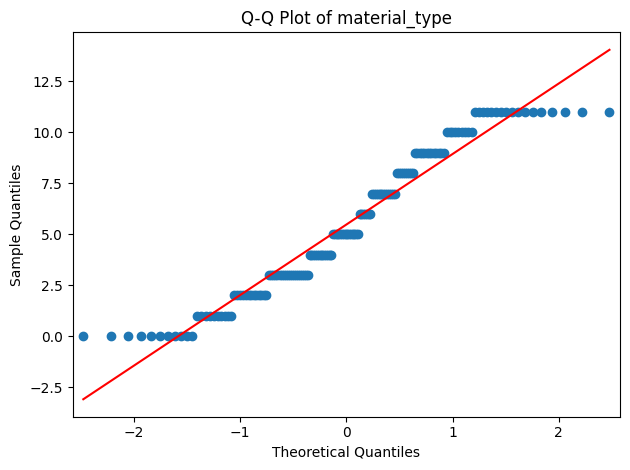

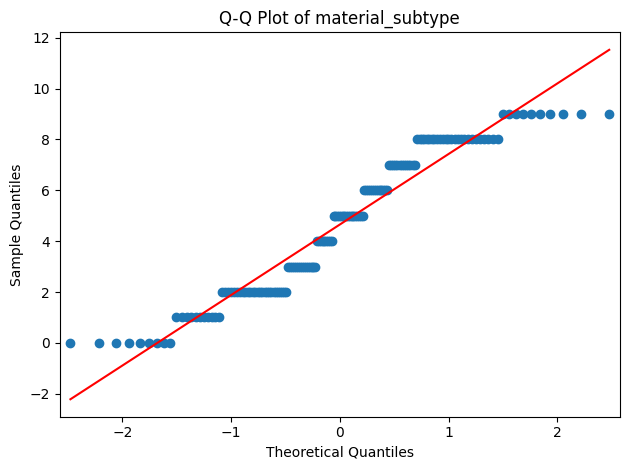

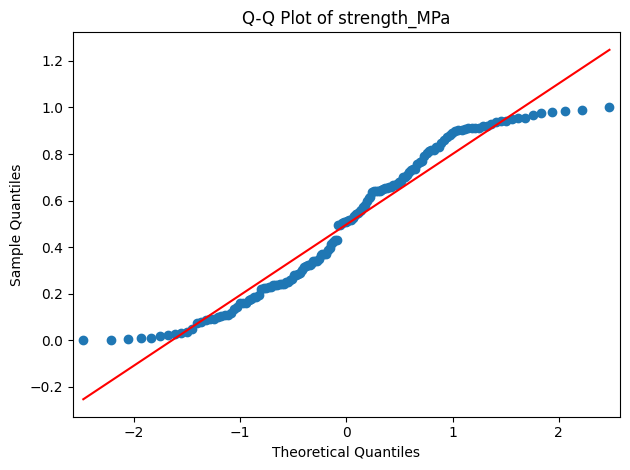

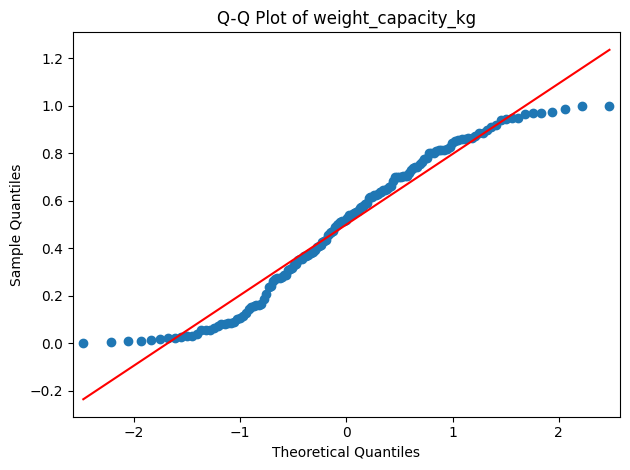

...

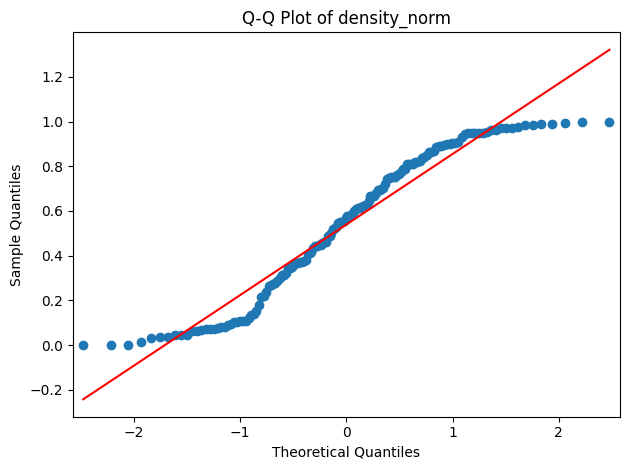

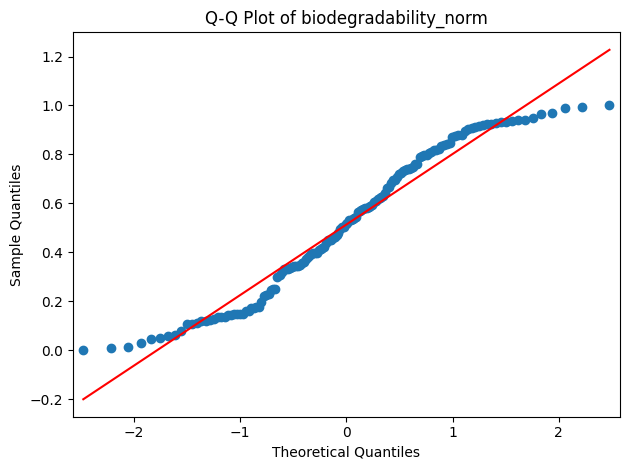

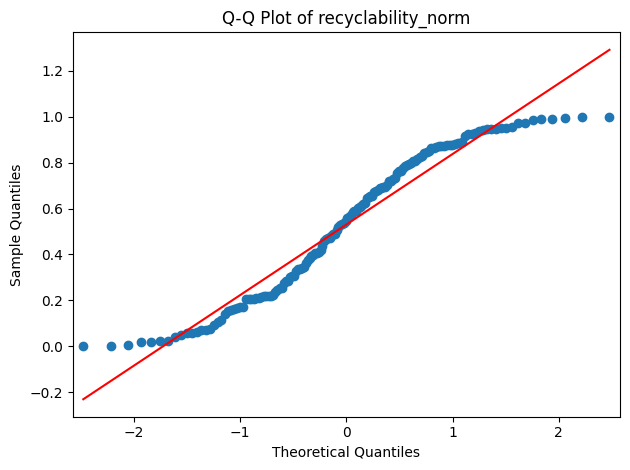

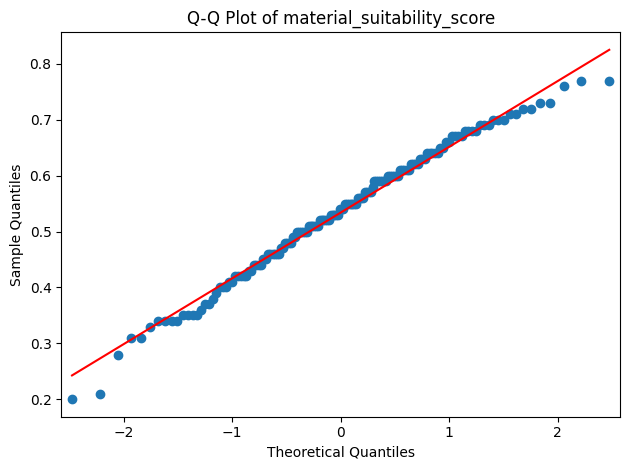

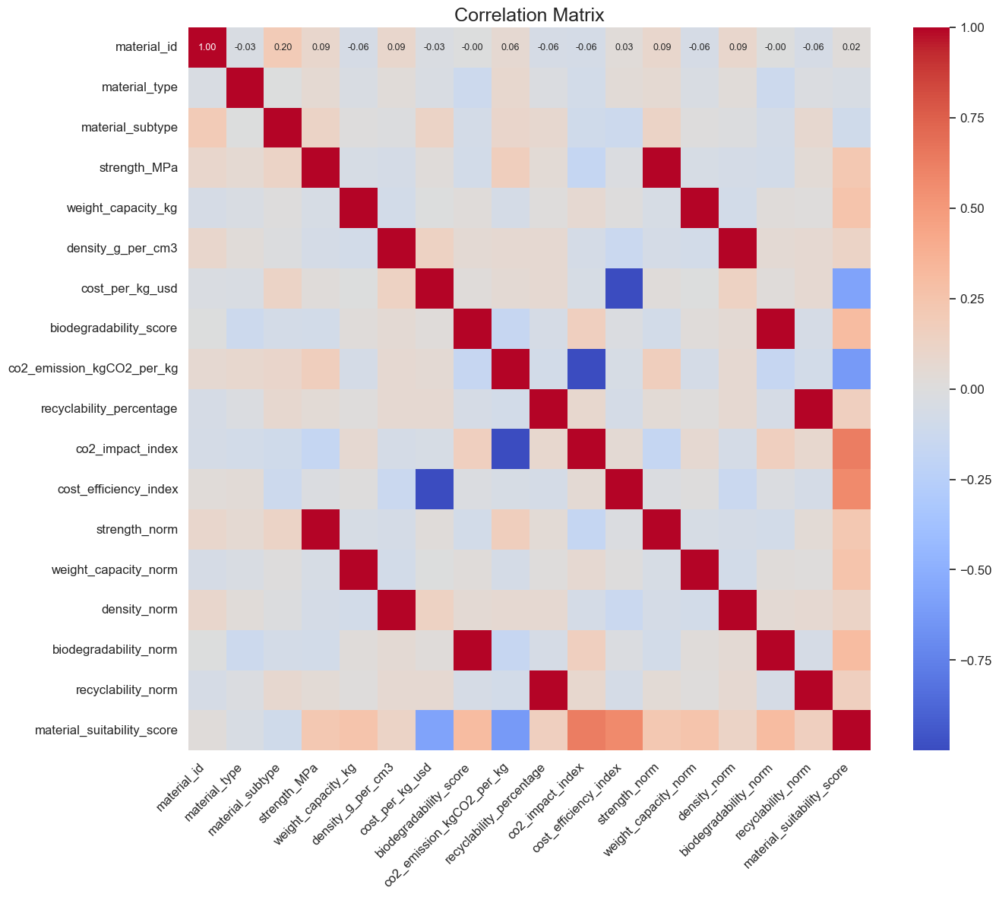

In [10]:

# =========================================================
# 6. Q-Q PLOTS (Normality Check)
# =========================================================
for col in numeric_cols:
    fig = sm.qqplot(df[col], line='s')
    plt.title(f"Q-Q Plot of {col}")
    plt.tight_layout()
    plt.show()

plt.figure(figsize=(14,12))
sns.set(font_scale=1.1)

sns.heatmap(
    df.corr(),
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    xticklabels=df.columns,
    yticklabels=df.columns,
    annot_kws={"size": 9}
)

plt.title("Correlation Matrix", fontsize=18)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()



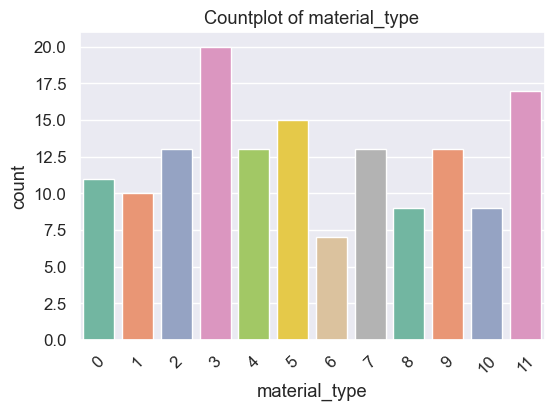

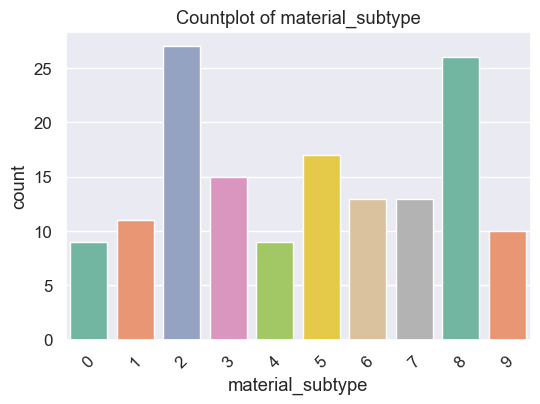

In [11]:

# =========================================================
# 8. CATEGORICAL FEATURE DISTRIBUTIONS
# =========================================================
# Specify categorical columns explicitly (after encoding)
categorical_cols = ['material_type', 'material_subtype']

for col in categorical_cols:
    plt.figure(figsize=(6,4))
    sns.countplot(x=df[col], palette="Set2")
    plt.title(f"Countplot of {col}")
    plt.xticks(rotation=45)
    plt.show()


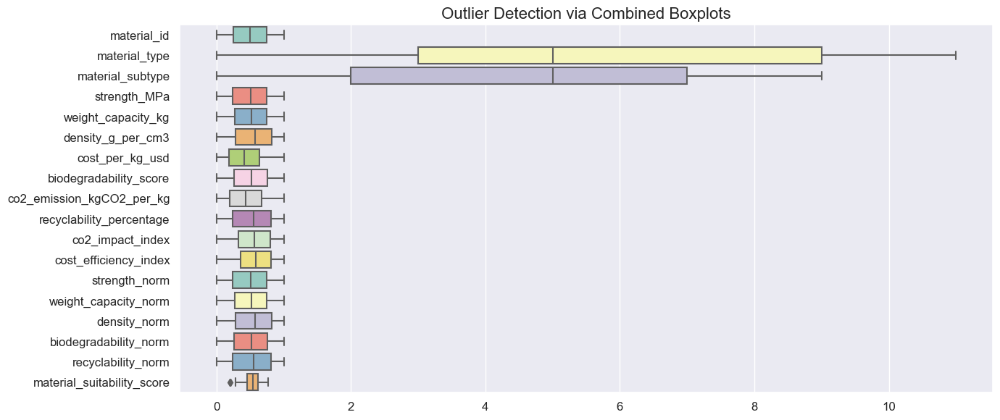

In [12]:

# =========================================================
# 9. OUTLIER DETECTION USING BOXPLOTS (ALL NUMERIC FEATURES)
# =========================================================

plt.figure(figsize=(14,6))
sns.boxplot(data=df[numeric_cols], orient="h", palette="Set3")
plt.title("Outlier Detection via Combined Boxplots", fontsize=16)
plt.tight_layout()
plt.show()

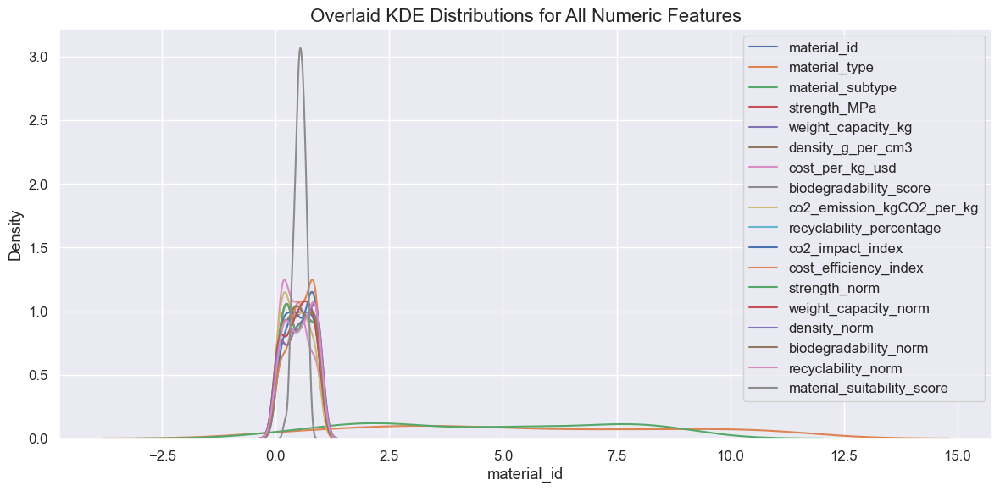

In [13]:

# =========================================================
# 10. DISTRIBUTION OVERLAY PLOTS (Using KDE)
# =========================================================

plt.figure(figsize=(12,6))
for col in numeric_cols:
    sns.kdeplot(df[col], label=col)
plt.legend()
plt.title("Overlaid KDE Distributions for All Numeric Features", fontsize=16)
plt.tight_layout()
plt.show()



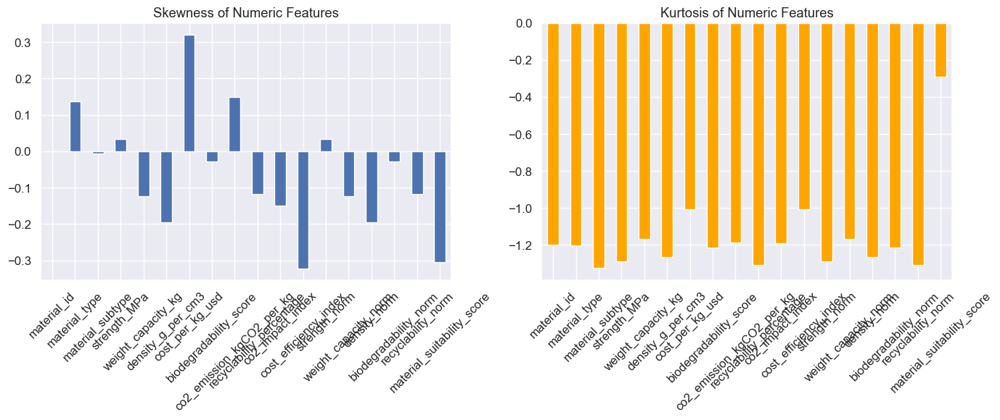

In [14]:

# =========================================================
# 11. SKEWNESS & KURTOSIS BARCHART
# =========================================================

import numpy as np

skew_vals = df[numeric_cols].skew()
kurt_vals = df[numeric_cols].kurtosis()

plt.figure(figsize=(14,6))

# Skewness
plt.subplot(1,2,1)
skew_vals.plot(kind='bar')
plt.title("Skewness of Numeric Features")
plt.xticks(rotation=45)

# Kurtosis
plt.subplot(1,2,2)
kurt_vals.plot(kind='bar', color='orange')
plt.title("Kurtosis of Numeric Features")
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import autocorrelation_plot
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Clear any leftover figures (prevents blank/ghost figures)
plt.close("all")

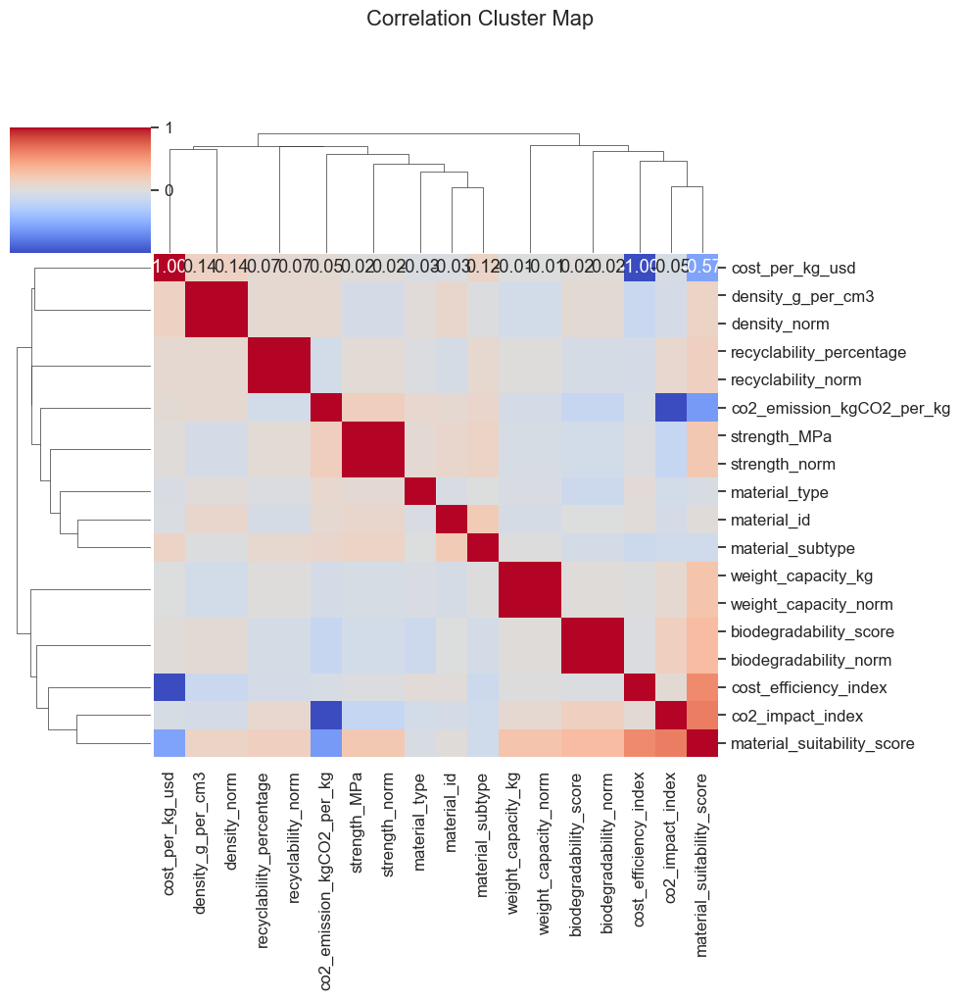

In [15]:

# -------- 12. CORRELATION CLUSTER MAP (fixed) ----------
# Don't call plt.figure() before clustermap — clustermap creates its own Figure.
# Use the returned ClusterGrid to set title/adjust spacing.
cg = sns.clustermap(df.corr(), annot=True, cmap="coolwarm", fmt=".2f", figsize=(10,10))
cg.fig.suptitle("Correlation Cluster Map", y=1.02)   # set title on the clustergrid figure
cg.fig.subplots_adjust(top=0.90)                    # make room for the suptitle
plt.show()
plt.close(cg.fig)


In [16]:

# =========================================================
# 13. FEATURE VS TARGET RELATIONSHIP (If target exists)
# =========================================================

if "target" in df.columns:
    for col in numeric_cols:
        if col != "target":
            plt.figure(figsize=(6,4))
            sns.scatterplot(x=df[col], y=df["target"])
            plt.title(f"{col} vs Target")
            plt.show()


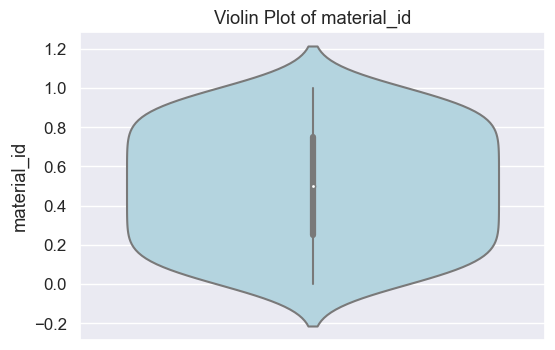

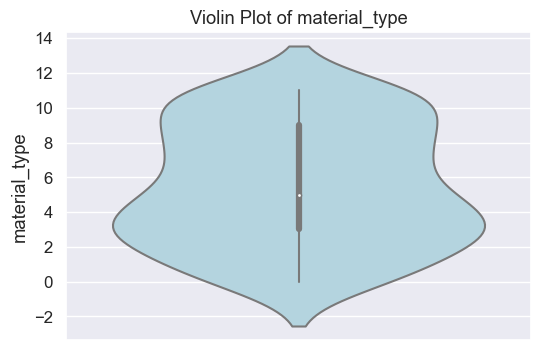

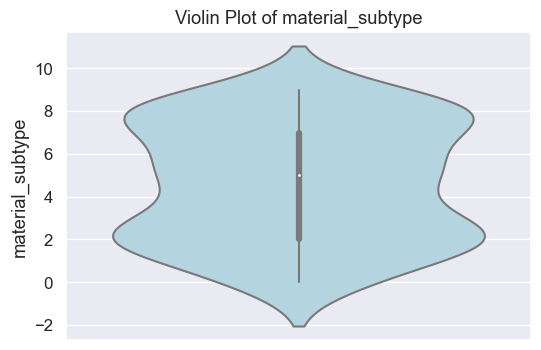

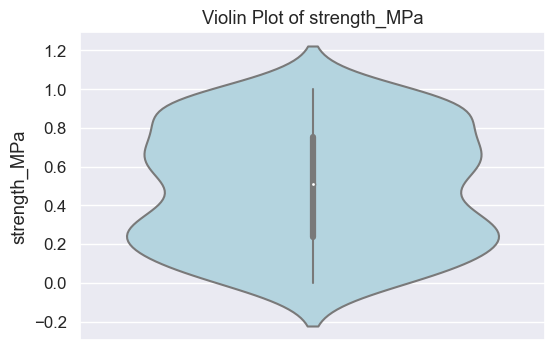

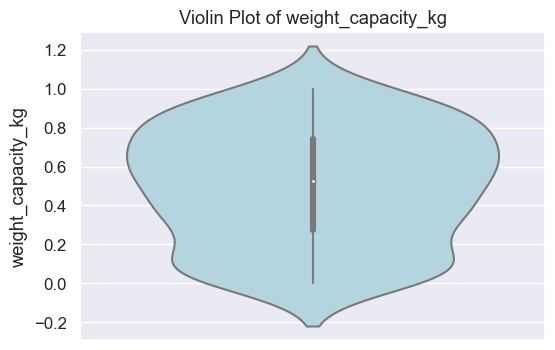

...

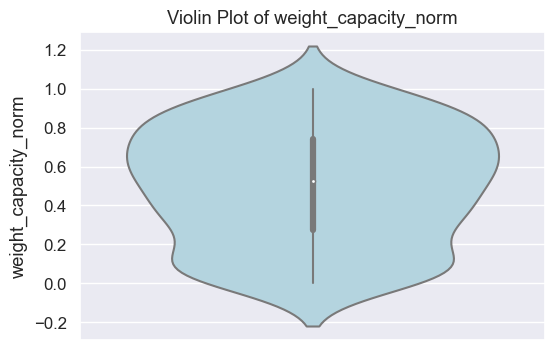

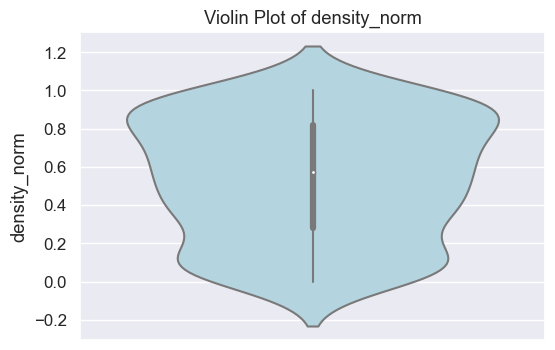

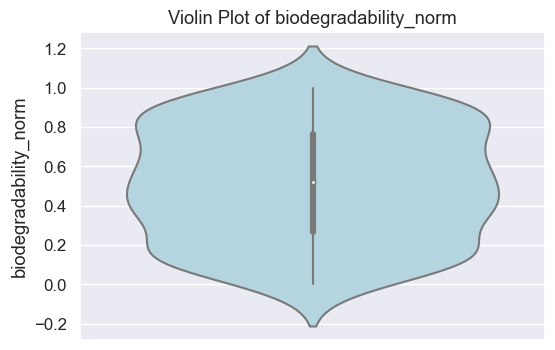

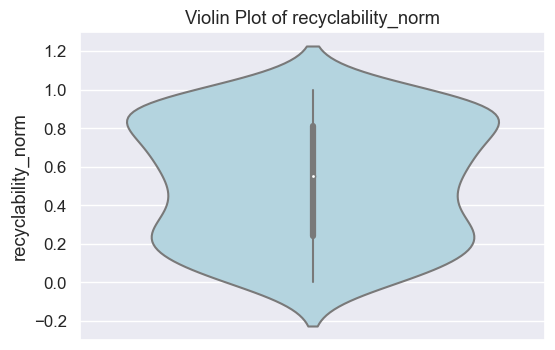

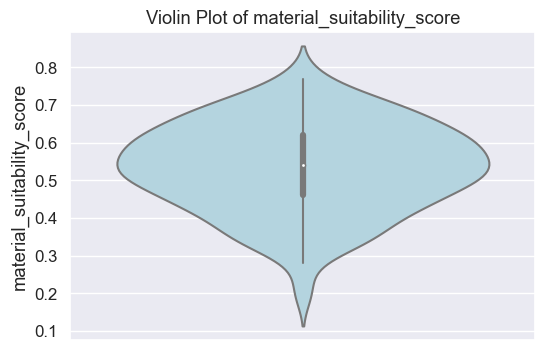

In [17]:

# =========================================================
# 14. VIOLIN PLOTS FOR SPREAD & DENSITY
# =========================================================

for col in numeric_cols:
    plt.figure(figsize=(6,4))
    sns.violinplot(y=df[col], color="lightblue")
    plt.title(f"Violin Plot of {col}")
    plt.show()


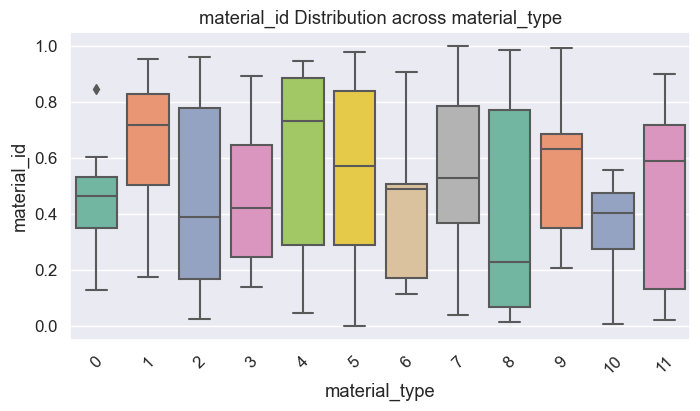

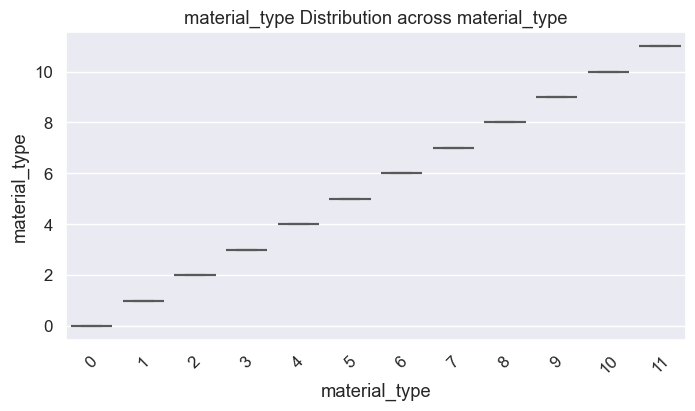

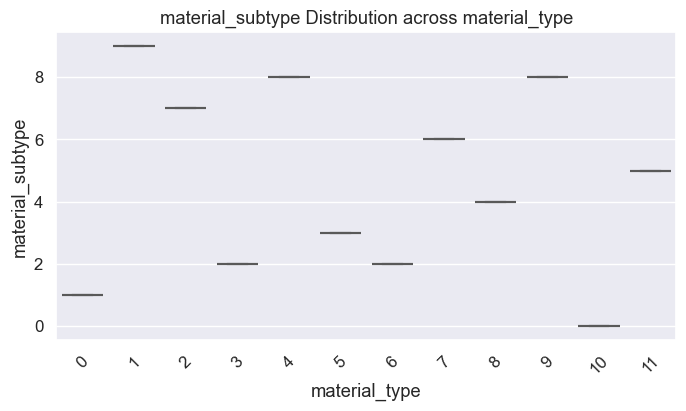

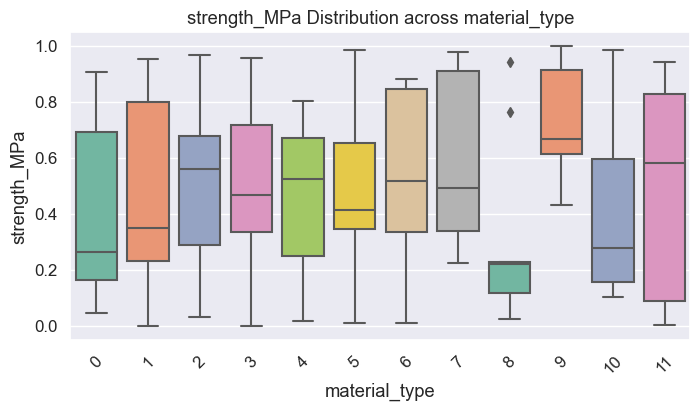

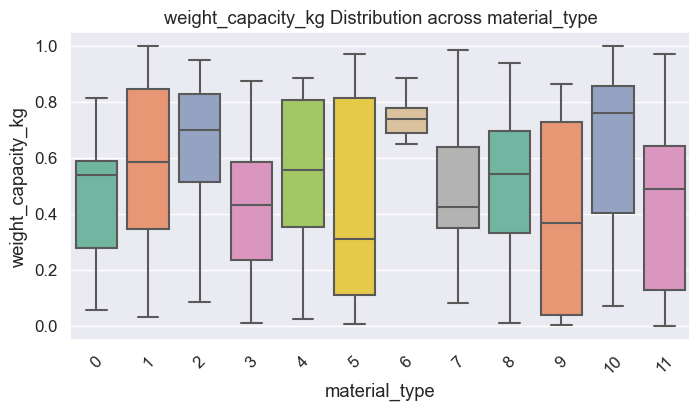

...

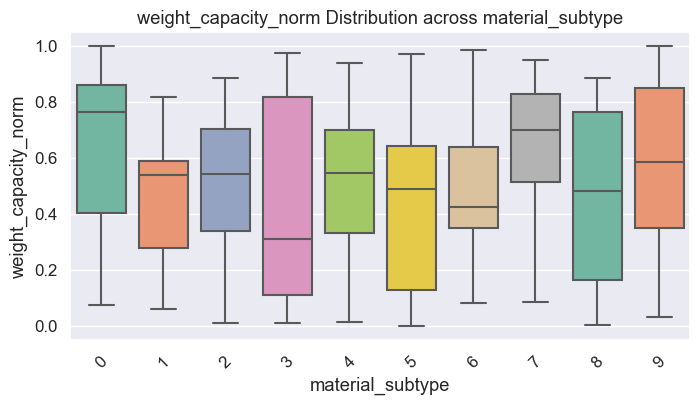

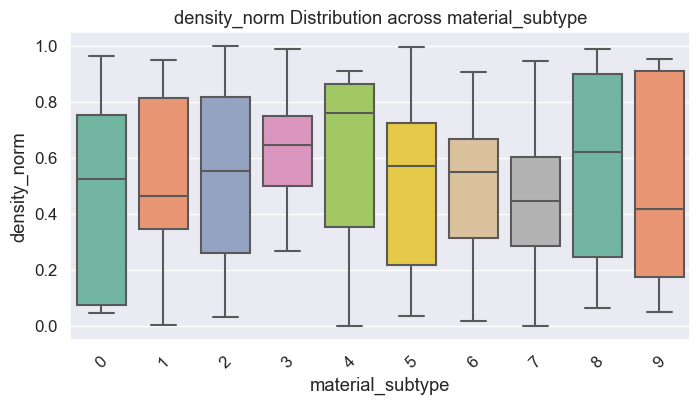

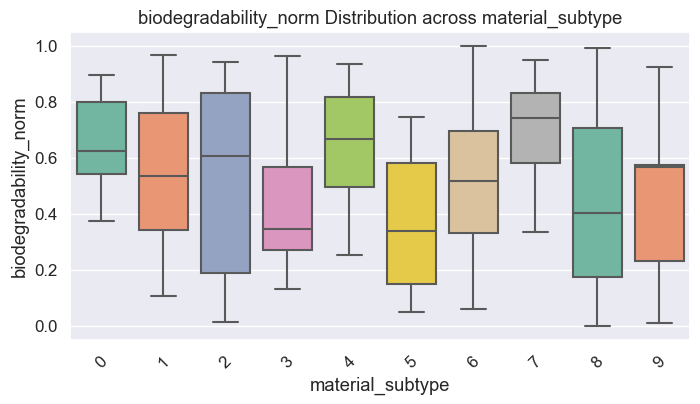

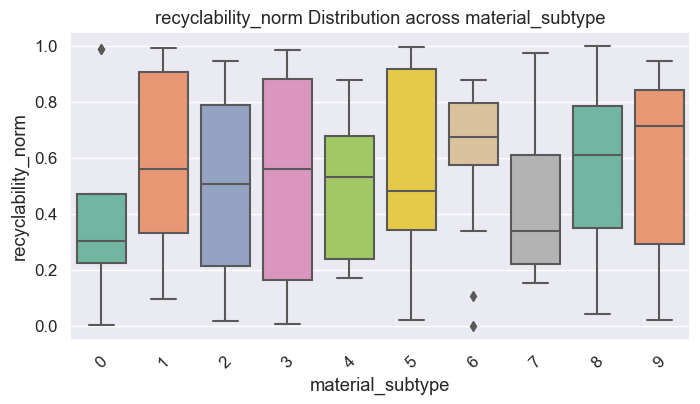

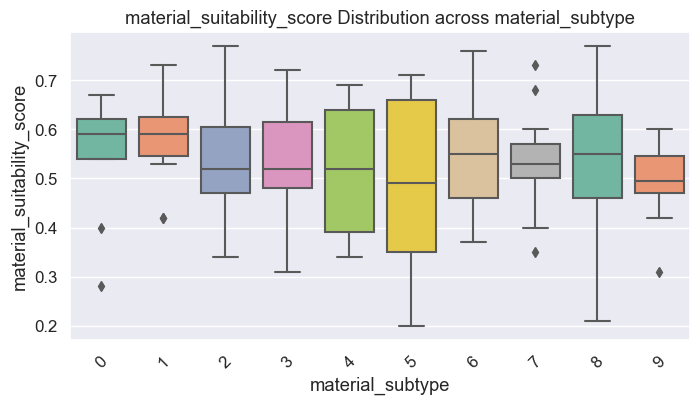

In [18]:

# =========================================================
# 15. CATEGORY-WISE BOXPLOTS (Categorical vs numeric)
# =========================================================

for cat in categorical_cols:
    for num in numeric_cols:
        plt.figure(figsize=(8,4))
        sns.boxplot(x=df[cat], y=df[num], palette="Set2")
        plt.title(f"{num} Distribution across {cat}")
        plt.xticks(rotation=45)
        plt.show()

In [19]:
# =========================================================
# 16. MISSING VALUE PERCENTAGE BAR CHART (CLEAN + CORRECT)
# =========================================================

missing_percent = (df.isnull().sum() / len(df)) * 100
missing_percent = missing_percent[missing_percent > 0]  # show only columns that have missing values

if len(missing_percent) > 0:
    plt.close('all')

    fig, ax = plt.subplots(figsize=(10, 5))

    missing_percent.sort_values().plot(kind='barh', ax=ax)

    ax.set_title("Missing Values Percentage", fontsize=14)
    ax.set_xlabel("Percentage (%)")

    fig.tight_layout()
    plt.show()

else:
    print("No missing values found — skipping missing value plot.")

No missing values found — skipping missing value plot.


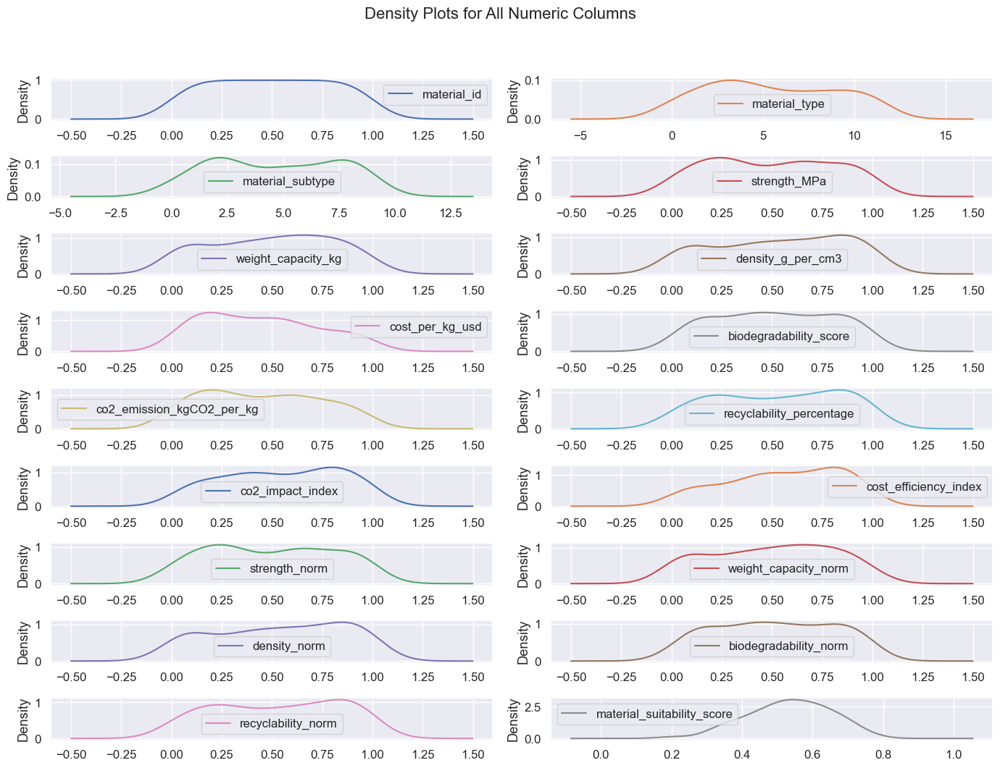

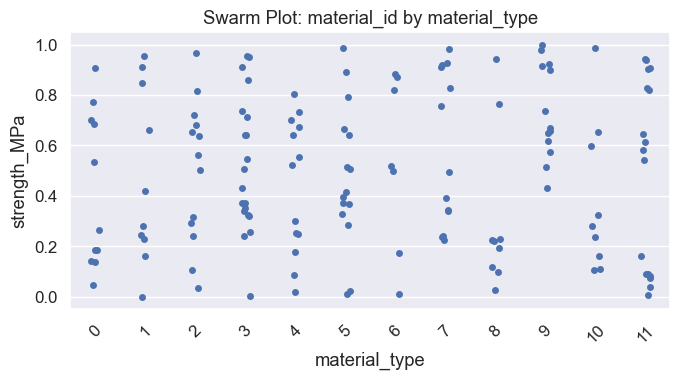

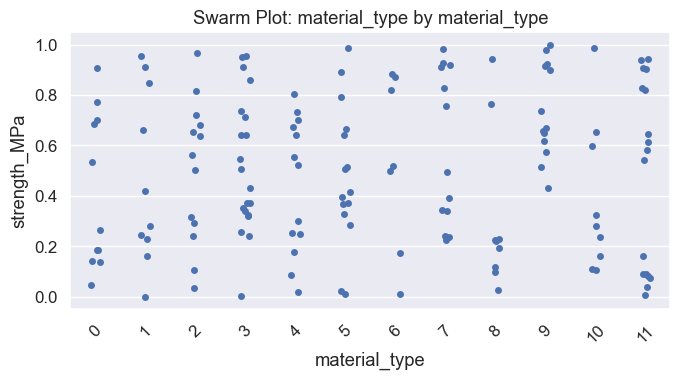

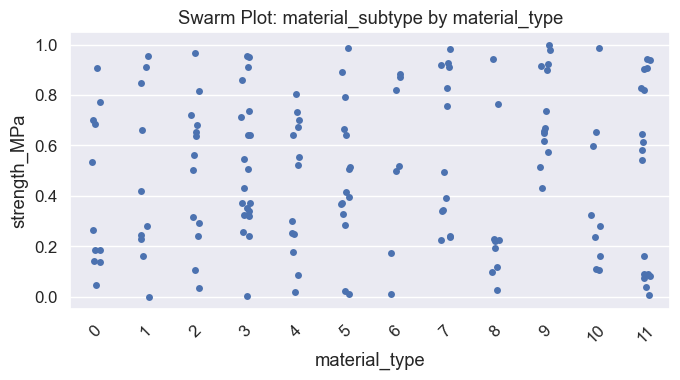

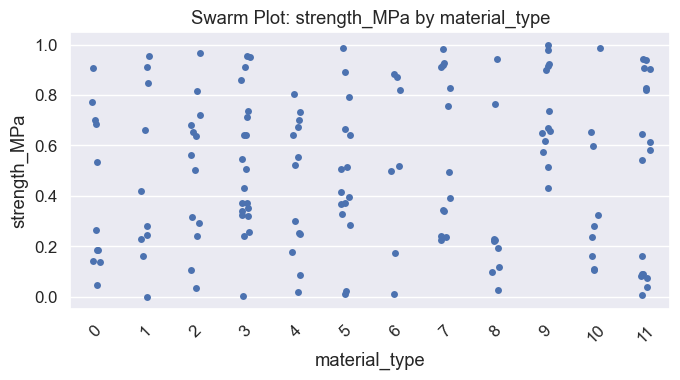

...

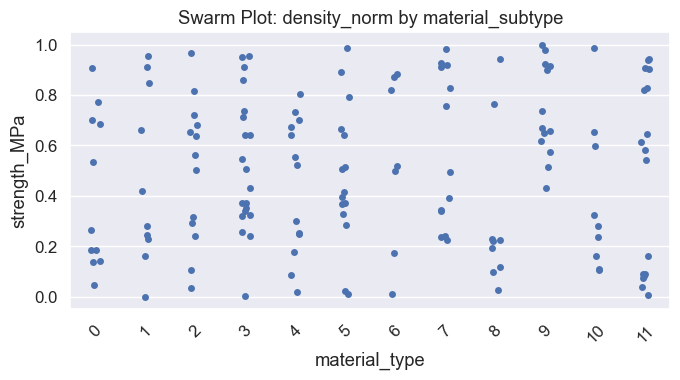

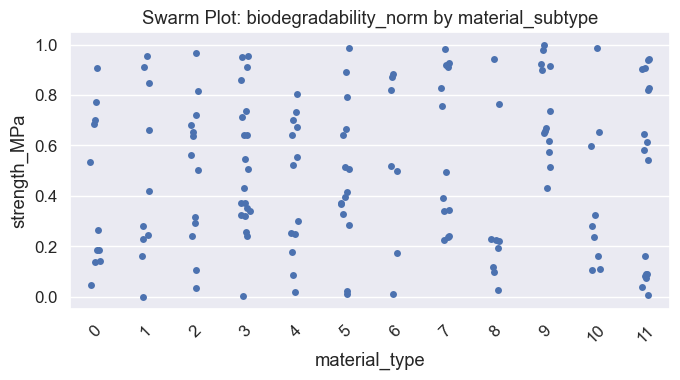

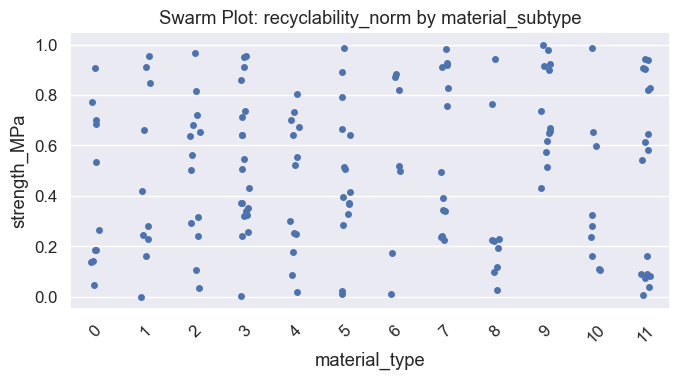

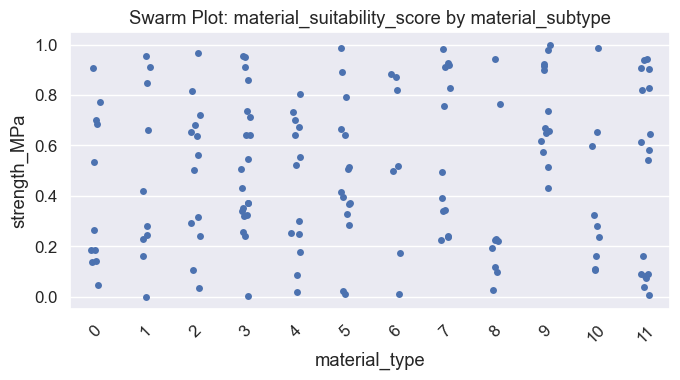

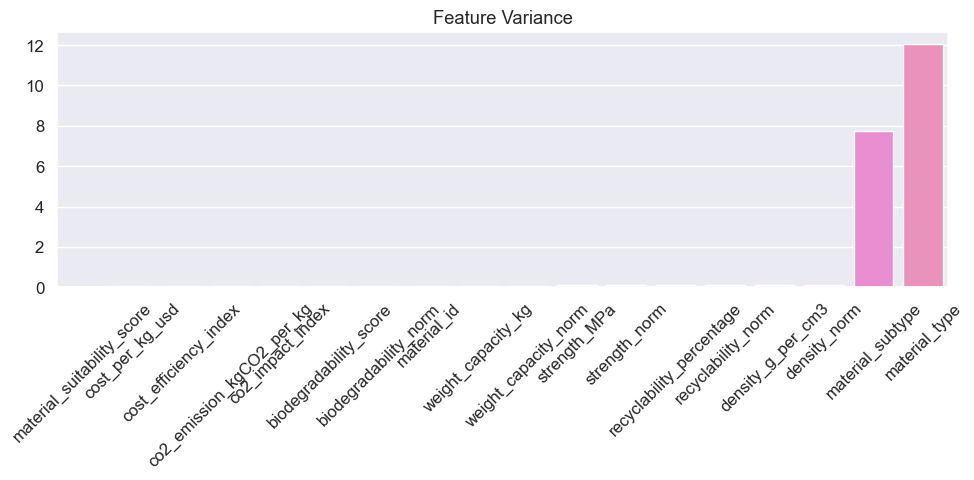

In [23]:

# -------- 17. DENSITY PLOT GRID (fixed layout) ----------
# pandas .plot(..., subplots=True) returns an array of Axes inside its own Figure.
# Capture that figure and use rect in tight_layout to leave room for the suptitle.
if len(numeric_cols) > 0:
    density_fig = df[numeric_cols].plot(
        kind='density',
        subplots=True,
        layout=(max(1, (len(numeric_cols)//2 + 1)), 2),
        figsize=(14, 12),
        sharex=False
    ).ravel()  # returns array-like of Axes; .ravel() ensures consistent handling

    # Use current figure to add suptitle and tighten layout with margin for the title.
    fig = plt.gcf()
    fig.suptitle("Density Plots for All Numeric Columns", fontsize=16)
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
    plt.close(fig)


# =========================================================
# 18. SWARM PLOTS (Categorical vs Numeric Outlier Detection)
# =========================================================

for cat in categorical_cols:
    for num in numeric_cols:
        plt.figure(figsize=(7,4))
        sns.stripplot(x='material_type', y='strength_MPa', data=df, jitter=True)
        plt.title(f"Swarm Plot: {num} by {cat}")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()



# =========================================================
# 19. HEATMAP OF FEATURE VARIANCE
# =========================================================

variance = df[numeric_cols].var().sort_values()

plt.figure(figsize=(10,5))
sns.barplot(x=variance.index, y=variance.values)
plt.title("Feature Variance")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



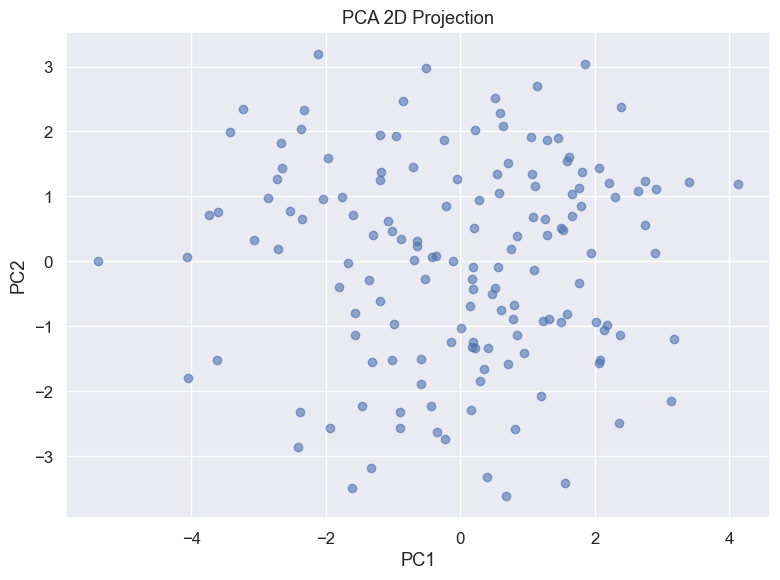

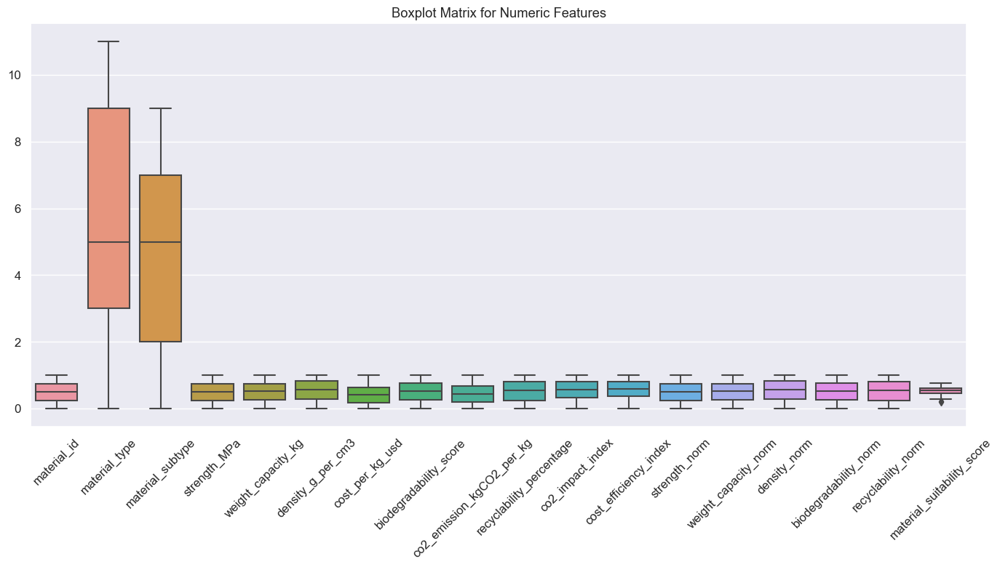

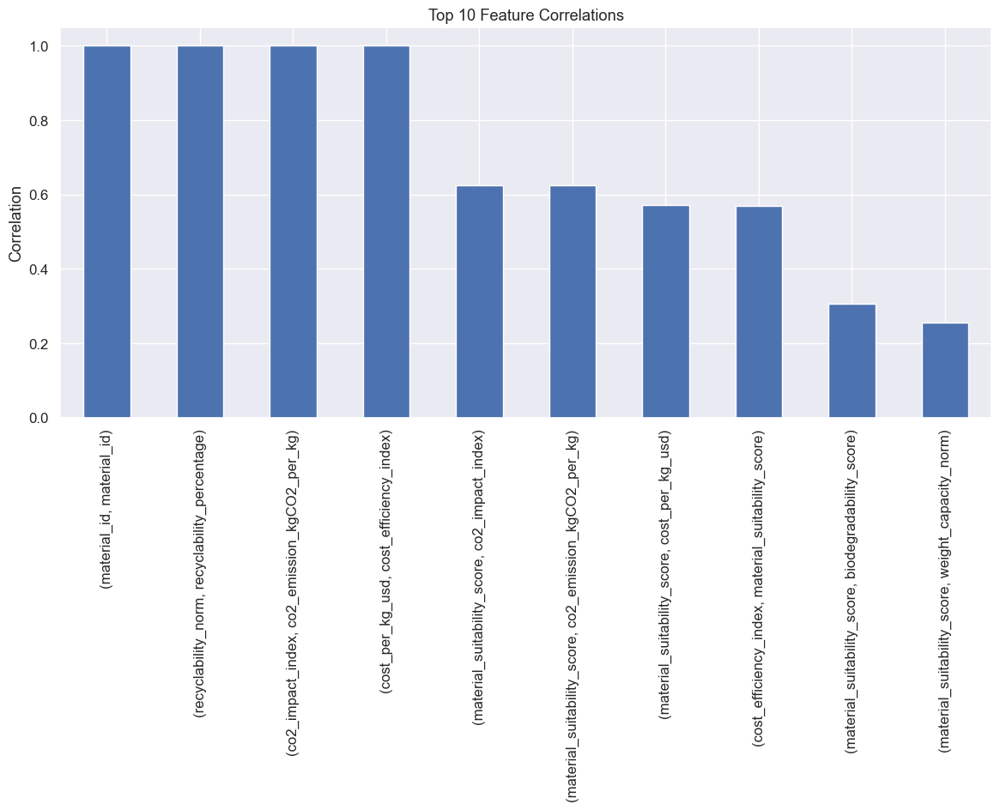

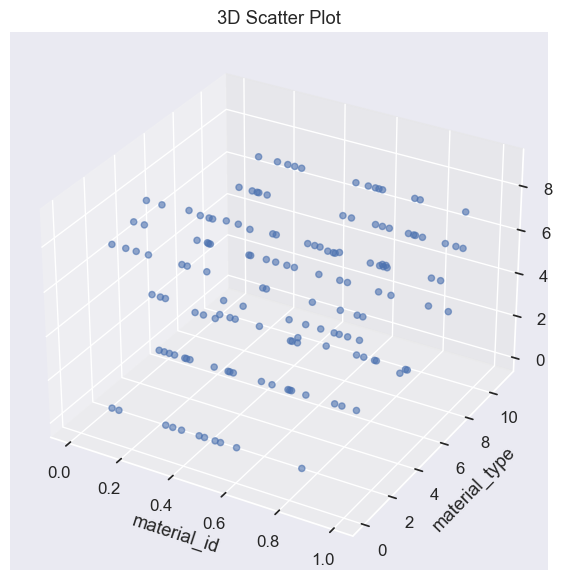

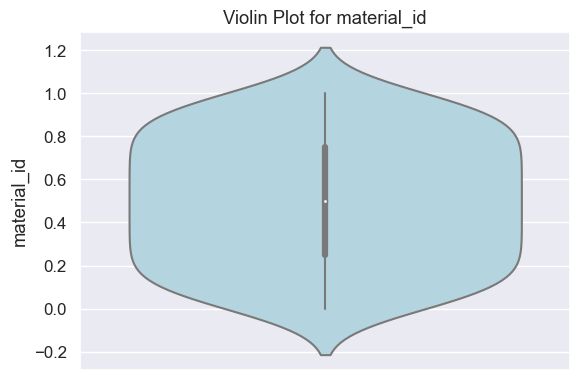

...

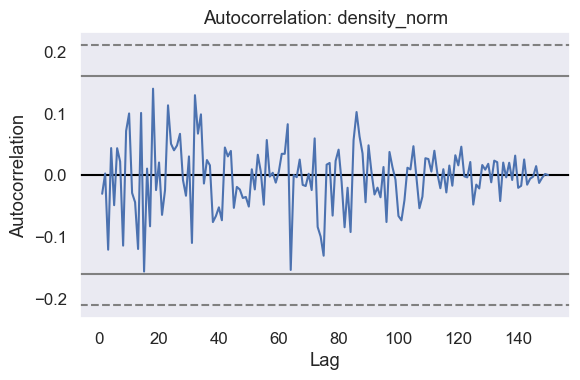

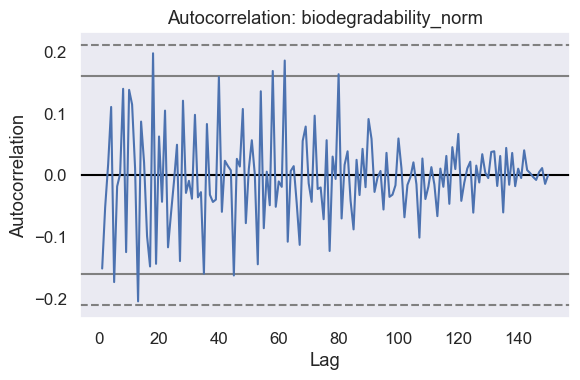

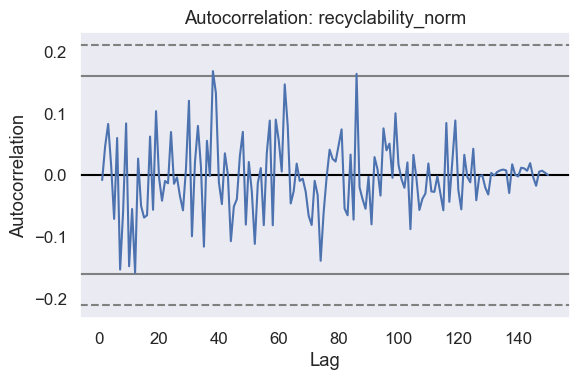

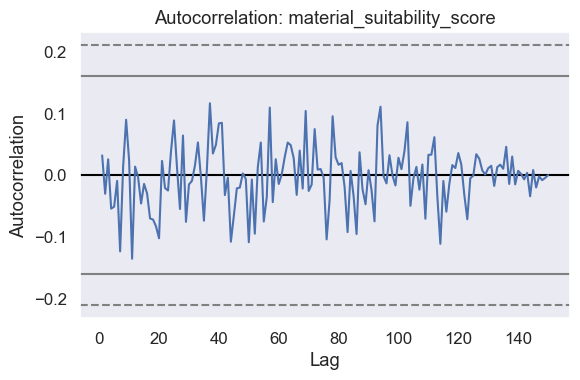

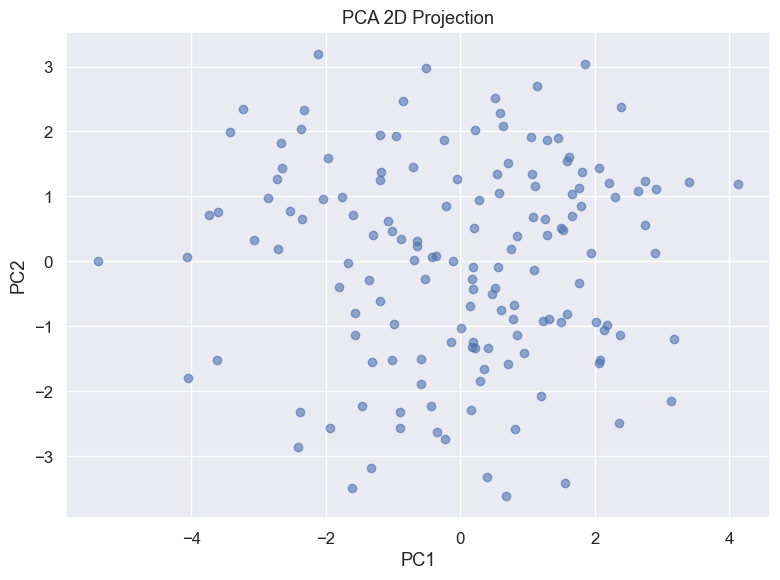

In [24]:


# =========================================================
# 20. PCA 2D PLOT (If numeric > 2)
# =========================================================

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

if len(numeric_cols) > 2:
    scaled = StandardScaler().fit_transform(df[numeric_cols])

    pca = PCA(n_components=2)
    pcs = pca.fit_transform(scaled)

    plt.figure(figsize=(8,6))
    plt.scatter(pcs[:,0], pcs[:,1], alpha=0.6)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title("PCA 2D Projection")
    plt.tight_layout()
    plt.show()


# =========================================================
# 21. BOXPLOT MATRIX (All numeric features)
# =========================================================

plt.figure(figsize=(14,8))
sns.boxplot(data=df[numeric_cols])
plt.xticks(rotation=45)
plt.title("Boxplot Matrix for Numeric Features")
plt.tight_layout()
plt.show()


# =========================================================
# 22. CORRELATION HEATMAP (Top 10 highest correlations)
# =========================================================

corr = df.corr().abs()
top_corr = corr.unstack().sort_values(ascending=False).drop_duplicates()[1:11]
top_corr.plot(kind='bar', figsize=(14,7))
plt.title("Top 10 Feature Correlations")
plt.ylabel("Correlation")
plt.subplots_adjust(bottom=0.25, top=0.90)   # ← Fixes the warning
plt.show()



# =========================================================
# 23. 3D SCATTER PLOT (If ≥3 numeric features)
# =========================================================

if len(numeric_cols) >= 3:
    from mpl_toolkits.mplot3d import Axes3D

    fig = plt.figure(figsize=(8,6))
    ax = fig.add_subplot(111, projection="3d")

    ax.scatter(
        df[numeric_cols[0]],
        df[numeric_cols[1]],
        df[numeric_cols[2]],
        alpha=0.6
    )

    ax.set_xlabel(numeric_cols[0])
    ax.set_ylabel(numeric_cols[1])
    ax.set_zlabel(numeric_cols[2])
    plt.title("3D Scatter Plot")
    plt.tight_layout()
    plt.show()


# =========================================================
# 24. VIOLIN GRID PLOTS
# =========================================================

for num in numeric_cols:
    plt.figure(figsize=(6,4))
    sns.violinplot(data=df, y=num, color="lightblue")
    plt.title(f"Violin Plot for {num}")
    plt.tight_layout()
    plt.show()


# -------- 25. AUTOCORRELATION PLOTS (explicit figures) ----------
# autocorrelation_plot creates its own figure; create/clear explicitly to avoid blank figs.
for col in numeric_cols:
    plt.close("all")
    fig_ac = plt.figure(figsize=(6,4))
    ax_ac = fig_ac.add_subplot(111)
    autocorrelation_plot(df[col].dropna(), ax=ax_ac)
    ax_ac.set_title(f"Autocorrelation: {col}")
    fig_ac.tight_layout()
    plt.show()
    plt.close(fig_ac)

# -------- extra: safe PCA block (keeps figure control consistent) ----------
if len(numeric_cols) > 2:
    scaled = StandardScaler().fit_transform(df[numeric_cols].dropna())
    pca = PCA(n_components=2)
    pcs = pca.fit_transform(scaled)

    fig_pca = plt.figure(figsize=(8,6))
    ax_pca = fig_pca.add_subplot(111)
    ax_pca.scatter(pcs[:,0], pcs[:,1], alpha=0.6)
    ax_pca.set_xlabel("PC1")
    ax_pca.set_ylabel("PC2")
    ax_pca.set_title("PCA 2D Projection")
    fig_pca.tight_layout()
    plt.show()
    plt.close(fig_pca)